# One dimensional interpolation experiment, Figure 2

In this notebook, we provide a minimal example of MARS framework, probably best suited as a first step prior to diving deeper into the code base.

You can play around with the parameters and see how MARS picks up sinusoidal inductive bias, all in under one minute of training!

In [16]:
import haiku as hk
import warnings
import jax.numpy as jnp
from tqdm import tqdm
warnings.filterwarnings("ignore")

seed = 1234
hk_key = hk.PRNGSequence(seed)


Let us first look at what the samples from the stochastic process look like, as well as fit the GPs to each of the tasks:

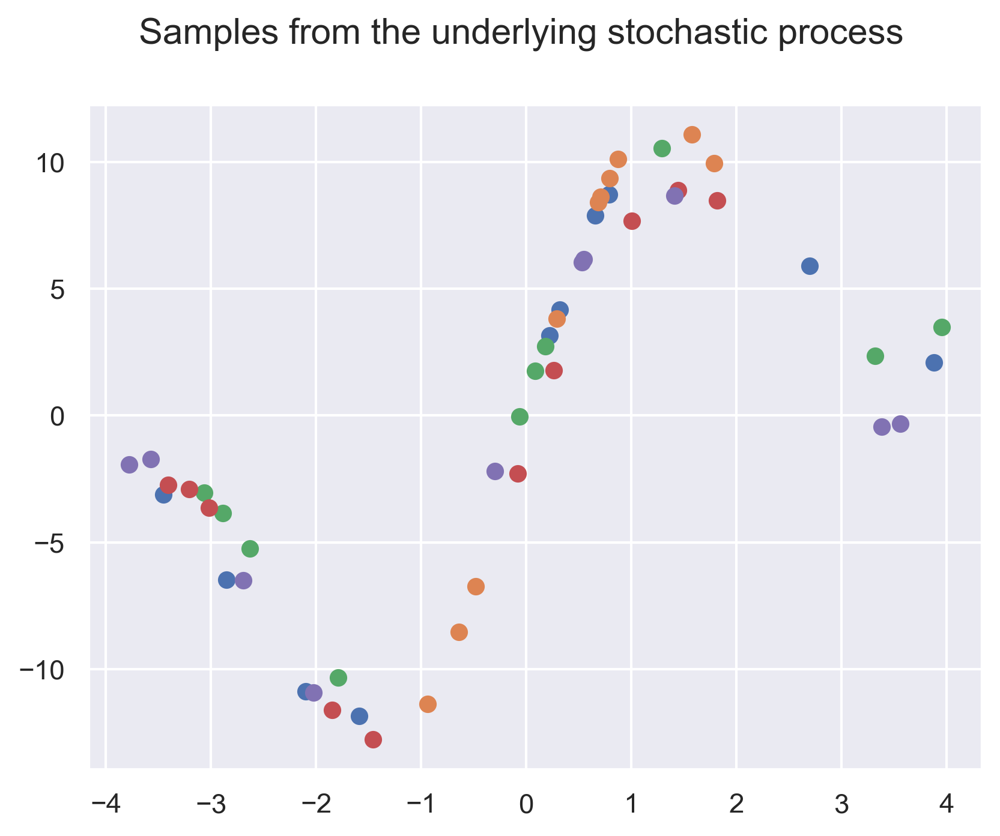

Performing CV for GP hyperparam.: 100%|██████████| 20/20 [01:03<00:00,  3.17s/it]


Chosen kernel is:  3.16**2 * RBF(length_scale=0.1)  and GP parameter alpha:  0.01 .


Fitting GPs to meta tasks.:   0%|          | 0/20 [00:00<?, ?it/s]

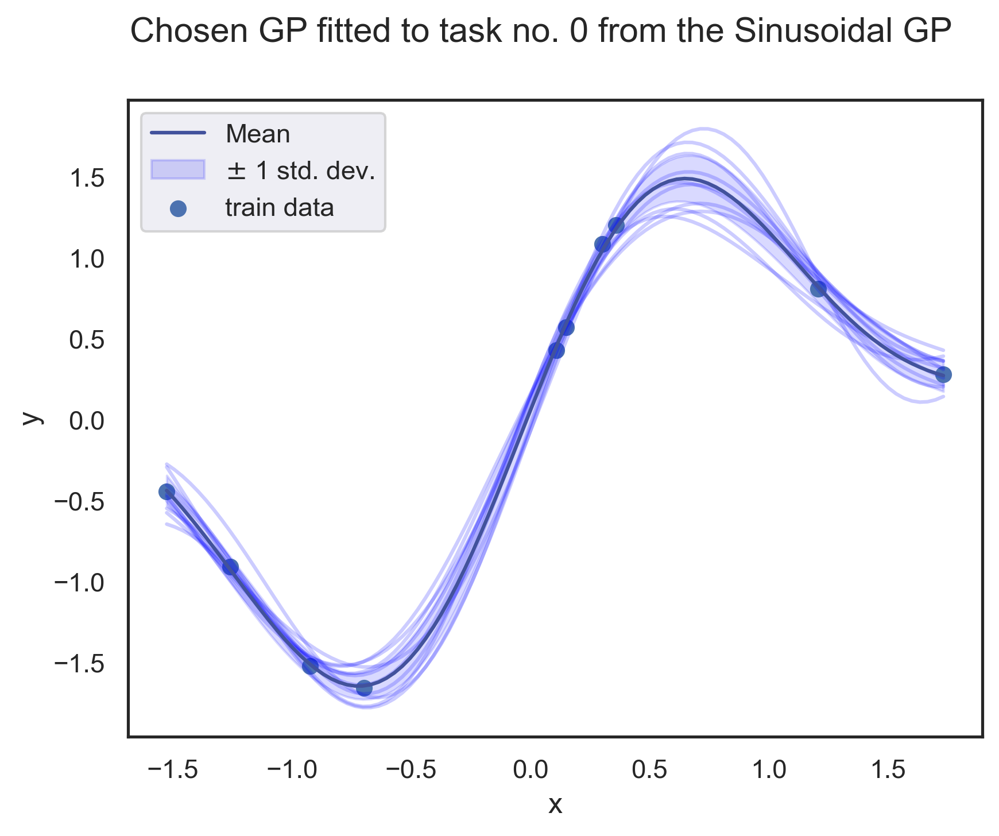

Fitting GPs to meta tasks.:   5%|▌         | 1/20 [00:00<00:04,  4.28it/s]

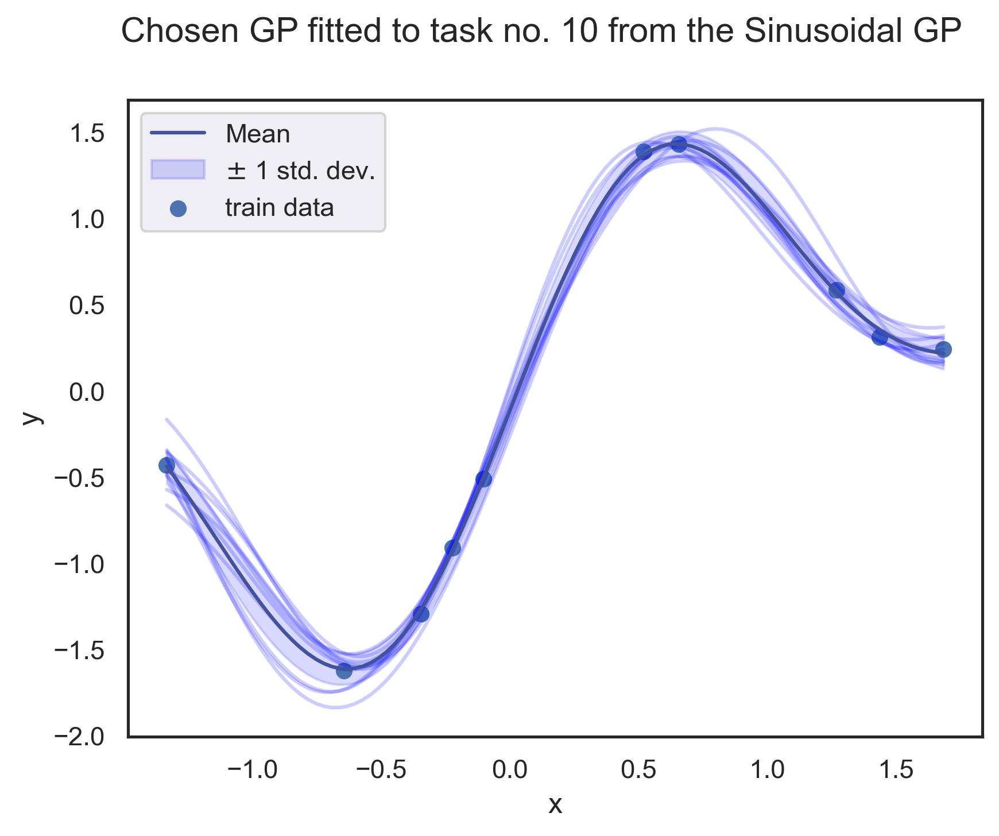

Fitting GPs to meta tasks.: 100%|██████████| 20/20 [00:00<00:00, 29.45it/s]


In [17]:
from MARS.modules.data_modules.simulator_base import GPMetaDatasetExample
# fit the GP
sim = GPMetaDatasetExample(dataset="gp_sin_20", init_seed=next(hk_key))
x_train, y_train, x_test, y_test = sim.example_data

We can see that for the 20 tasks above, the chosen kernel and alpha parameter for the GP using CV (with negative MSE as the selection criterion) was the following:

In [18]:
print("Chosen kernel is: ", sim.gps[0].kernel, " and GP parameter alpha: ", sim.gps[0].alpha, ".")

Chosen kernel is:  3.16**2 * RBF(length_scale=0.1)  and GP parameter alpha:  0.01 .


We now initialize the Score Estimator network and train it using the samples obtained from the fitted GPS:

In [19]:
from MARS.modules.score_network.score_network import ScoreEstimator

# initializer score network
score_net = ScoreEstimator(function_sim=sim,
                           x_dim=sim.input_size,
                           sample_from_gp=True,
                           learning_rate=0.001,
                           loss_type="exact_w_spectr_norm",
                           n_fn_samples=20)
# train score network
_ = score_net.train(hk_key, n_iter=250)

Training SNN., loss is -4.516038: 100%|██████████| 250/250 [00:10<00:00, 23.44it/s]  


We now proceed to the final step of the MARS framework, where we utilize the fitted GPs and Score Estimator network in order to train a fSVGD BNN:

  0%|          | 0/25 [00:00<?, ?it/s]

Step 1/100 | train_nll_loss: 56.5195 | avg_triu_k: 0.0101 | eval_nll: 3.8292 | eval_rmse: 6.3666 | eval_calib: 0.2415 | Duration 0.59 sec | Time per sample 593.69 ms


  4%|▍         | 1/25 [00:00<00:21,  1.10it/s]

Step 1/100 | train_nll_loss: 23.6529 | avg_triu_k: 0.0097 | eval_nll: 3.2678 | eval_rmse: 4.4964 | eval_calib: 0.2340 | Duration 0.00 sec | Time per sample 2.69 ms


  8%|▊         | 2/25 [00:01<00:12,  1.82it/s]

Step 1/100 | train_nll_loss: 23.2568 | avg_triu_k: 0.0053 | eval_nll: 3.2243 | eval_rmse: 3.3231 | eval_calib: 0.2470 | Duration 0.00 sec | Time per sample 3.10 ms


 12%|█▏        | 3/25 [00:01<00:12,  1.75it/s]

Step 1/100 | train_nll_loss: 23.1536 | avg_triu_k: 0.0108 | eval_nll: 3.2099 | eval_rmse: 3.2627 | eval_calib: 0.2467 | Duration 0.00 sec | Time per sample 2.85 ms


 16%|█▌        | 4/25 [00:02<00:09,  2.21it/s]

Step 1/100 | train_nll_loss: 23.3971 | avg_triu_k: 0.0122 | eval_nll: 3.2005 | eval_rmse: 2.5209 | eval_calib: 0.2500 | Duration 0.00 sec | Time per sample 2.84 ms


 20%|██        | 5/25 [00:02<00:07,  2.60it/s]

Step 1/100 | train_nll_loss: 23.1457 | avg_triu_k: 0.0196 | eval_nll: 3.1917 | eval_rmse: 2.5538 | eval_calib: 0.2500 | Duration 0.00 sec | Time per sample 2.78 ms


 28%|██▊       | 7/25 [00:02<00:05,  3.16it/s]

Step 1/100 | train_nll_loss: 23.1637 | avg_triu_k: 0.0188 | eval_nll: 3.1798 | eval_rmse: 1.7527 | eval_calib: 0.2500 | Duration 0.00 sec | Time per sample 2.70 ms
Step 1/100 | train_nll_loss: 23.2658 | avg_triu_k: 0.0168 | eval_nll: 3.1714 | eval_rmse: 1.6955 | eval_calib: 0.2500 | Duration 0.00 sec | Time per sample 2.87 ms


 32%|███▏      | 8/25 [00:03<00:05,  3.32it/s]

Step 1/100 | train_nll_loss: 23.0148 | avg_triu_k: 0.0201 | eval_nll: 3.1839 | eval_rmse: 2.0681 | eval_calib: 0.2500 | Duration 0.00 sec | Time per sample 2.76 ms


 36%|███▌      | 9/25 [00:03<00:04,  3.45it/s]

Step 1/100 | train_nll_loss: 23.1868 | avg_triu_k: 0.0415 | eval_nll: 3.1731 | eval_rmse: 1.9716 | eval_calib: 0.2500 | Duration 0.00 sec | Time per sample 2.82 ms


 40%|████      | 10/25 [00:03<00:04,  3.53it/s]

Step 1/100 | train_nll_loss: 23.0954 | avg_triu_k: 0.0075 | eval_nll: 3.1858 | eval_rmse: 2.1661 | eval_calib: 0.2500 | Duration 0.00 sec | Time per sample 2.76 ms


 44%|████▍     | 11/25 [00:03<00:03,  3.58it/s]

Step 1/100 | train_nll_loss: 23.1064 | avg_triu_k: 0.0128 | eval_nll: 3.1878 | eval_rmse: 2.1898 | eval_calib: 0.2477 | Duration 0.00 sec | Time per sample 2.89 ms


 48%|████▊     | 12/25 [00:04<00:03,  3.58it/s]

Step 1/100 | train_nll_loss: 22.9455 | avg_triu_k: 0.0212 | eval_nll: 3.1714 | eval_rmse: 1.2366 | eval_calib: 0.2500 | Duration 0.00 sec | Time per sample 2.86 ms


 52%|█████▏    | 13/25 [00:04<00:03,  3.64it/s]

Step 1/100 | train_nll_loss: 23.1378 | avg_triu_k: 0.0054 | eval_nll: 3.1826 | eval_rmse: 1.4443 | eval_calib: 0.2500 | Duration 0.00 sec | Time per sample 2.69 ms


 56%|█████▌    | 14/25 [00:04<00:02,  3.68it/s]

Step 1/100 | train_nll_loss: 23.0702 | avg_triu_k: 0.0259 | eval_nll: 3.1609 | eval_rmse: 1.3514 | eval_calib: 0.2500 | Duration 0.00 sec | Time per sample 2.82 ms


 64%|██████▍   | 16/25 [00:05<00:02,  3.75it/s]

Step 1/100 | train_nll_loss: 23.0734 | avg_triu_k: 0.0144 | eval_nll: 3.1669 | eval_rmse: 1.5583 | eval_calib: 0.2500 | Duration 0.00 sec | Time per sample 2.77 ms
Step 1/100 | train_nll_loss: 23.1945 | avg_triu_k: 0.0115 | eval_nll: 3.1763 | eval_rmse: 1.4896 | eval_calib: 0.2500 | Duration 0.00 sec | Time per sample 3.00 ms


 72%|███████▏  | 18/25 [00:05<00:01,  3.78it/s]

Step 1/100 | train_nll_loss: 23.5062 | avg_triu_k: 0.0130 | eval_nll: 3.1830 | eval_rmse: 1.7040 | eval_calib: 0.2500 | Duration 0.00 sec | Time per sample 2.77 ms
Step 1/100 | train_nll_loss: 23.1428 | avg_triu_k: 0.0058 | eval_nll: 3.1839 | eval_rmse: 1.3974 | eval_calib: 0.2500 | Duration 0.00 sec | Time per sample 2.79 ms


 76%|███████▌  | 19/25 [00:06<00:01,  3.75it/s]

Step 1/100 | train_nll_loss: 23.1329 | avg_triu_k: 0.0094 | eval_nll: 3.1925 | eval_rmse: 1.4162 | eval_calib: 0.2500 | Duration 0.00 sec | Time per sample 2.81 ms


 84%|████████▍ | 21/25 [00:06<00:01,  3.82it/s]

Step 1/100 | train_nll_loss: 23.0914 | avg_triu_k: 0.0244 | eval_nll: 3.1702 | eval_rmse: 1.3078 | eval_calib: 0.2500 | Duration 0.00 sec | Time per sample 2.73 ms


 88%|████████▊ | 22/25 [00:06<00:00,  3.83it/s]

Step 1/100 | train_nll_loss: 23.0634 | avg_triu_k: 0.0573 | eval_nll: 3.1770 | eval_rmse: 1.7837 | eval_calib: 0.2500 | Duration 0.00 sec | Time per sample 2.91 ms


 92%|█████████▏| 23/25 [00:07<00:00,  3.83it/s]

Step 1/100 | train_nll_loss: 23.0386 | avg_triu_k: 0.0087 | eval_nll: 3.1728 | eval_rmse: 1.6043 | eval_calib: 0.2500 | Duration 0.00 sec | Time per sample 2.68 ms


 96%|█████████▌| 24/25 [00:07<00:00,  3.84it/s]

Step 1/100 | train_nll_loss: 23.0573 | avg_triu_k: 0.0106 | eval_nll: 3.1934 | eval_rmse: 1.8805 | eval_calib: 0.2500 | Duration 0.00 sec | Time per sample 2.96 ms


100%|██████████| 25/25 [00:07<00:00,  3.28it/s]

Step 1/100 | train_nll_loss: 23.1082 | avg_triu_k: 0.0345 | eval_nll: 3.1692 | eval_rmse: 1.5681 | eval_calib: 0.2500 | Duration 0.00 sec | Time per sample 2.74 ms


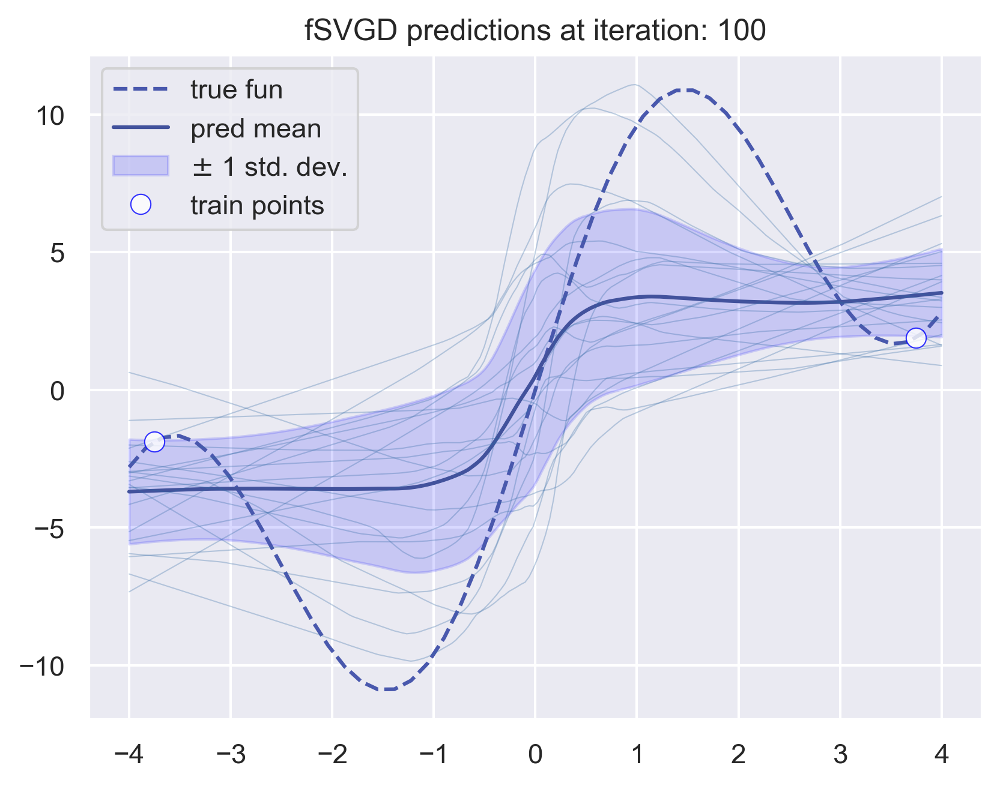

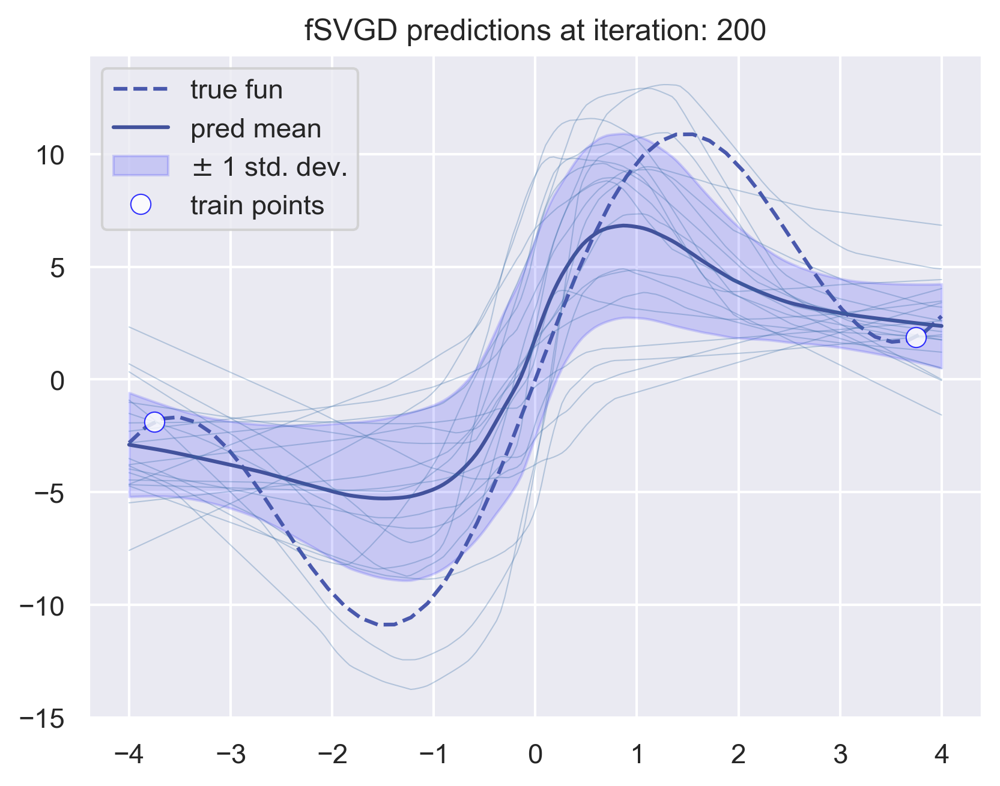

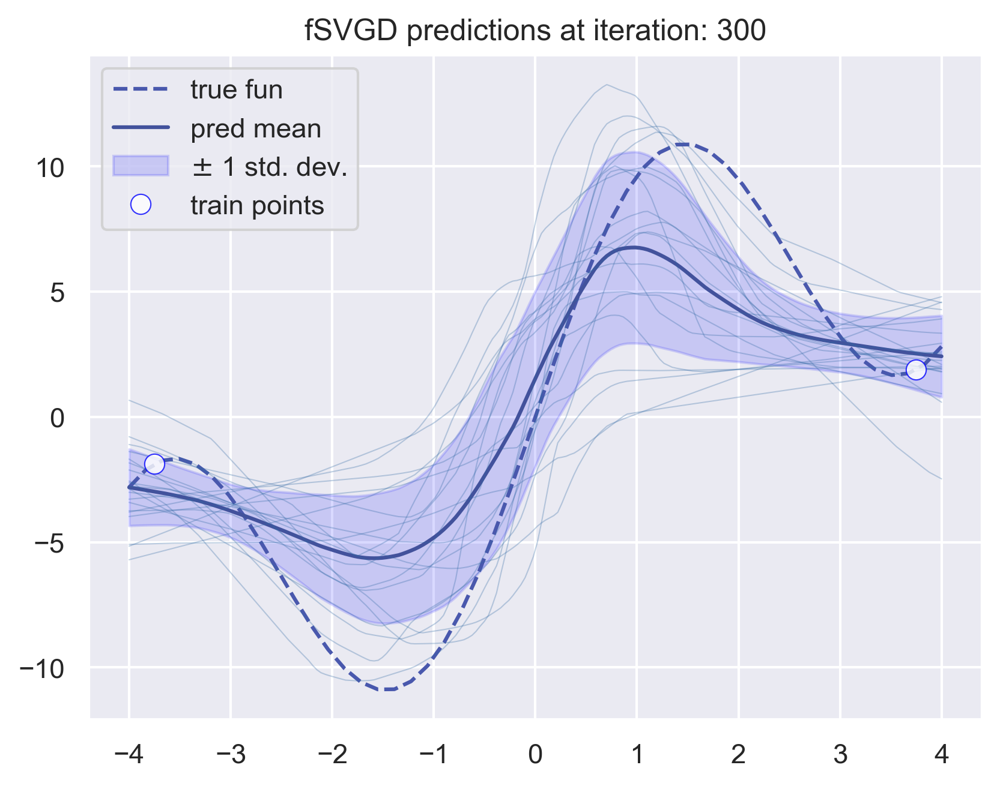

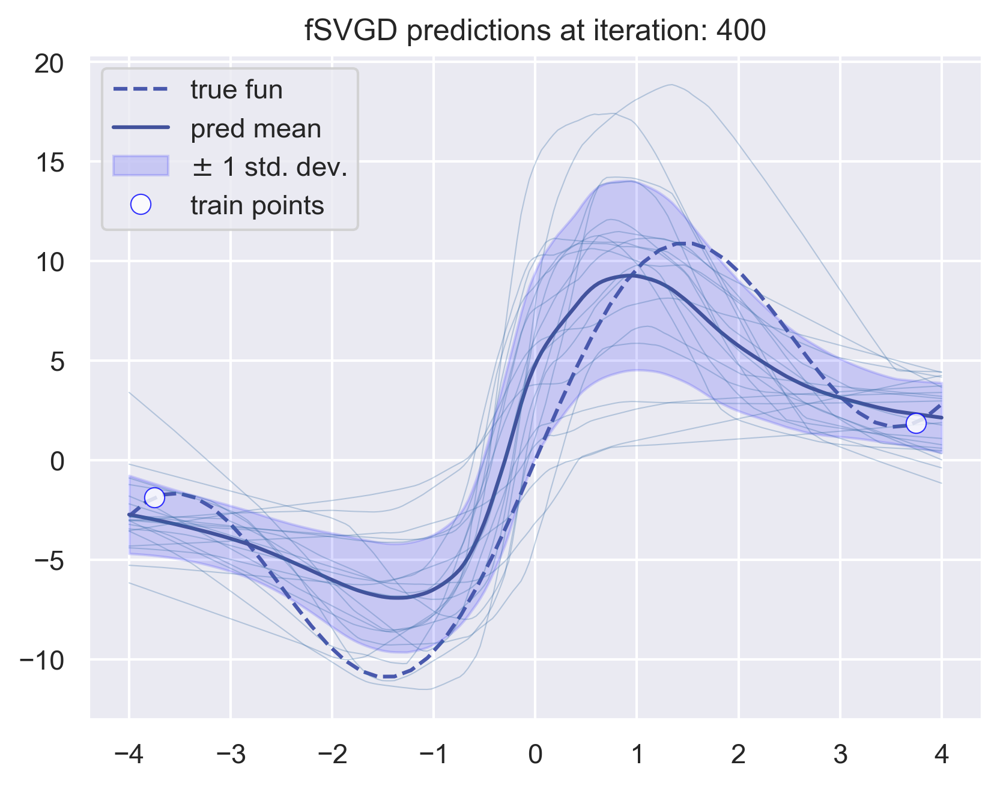

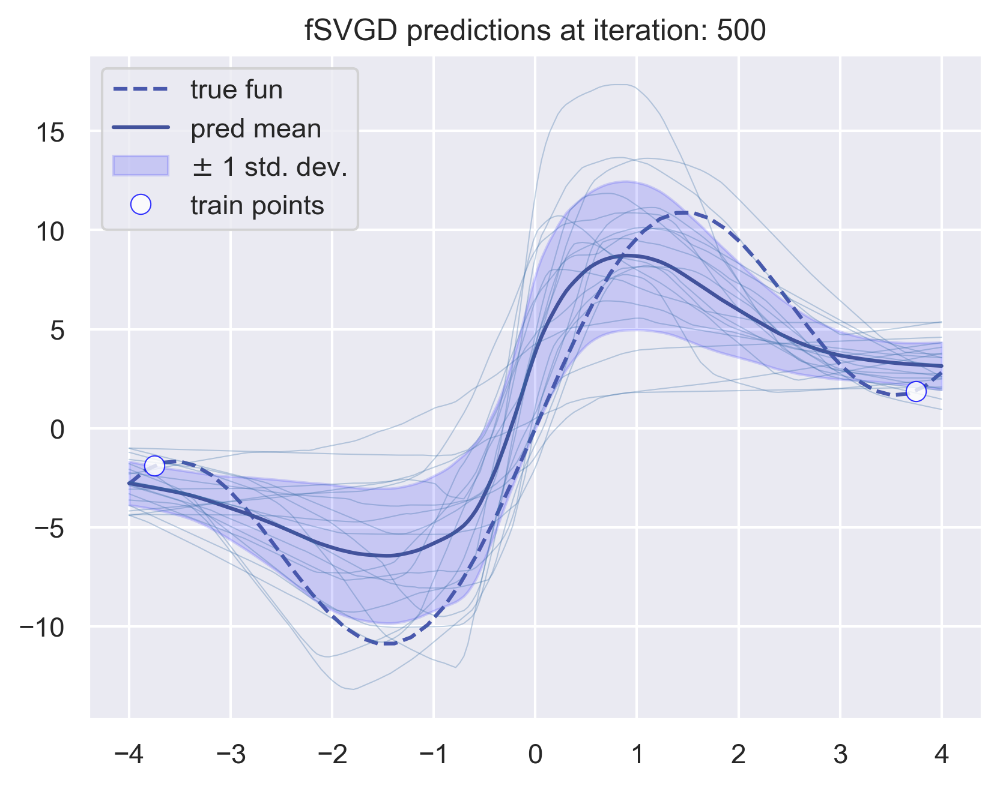

...

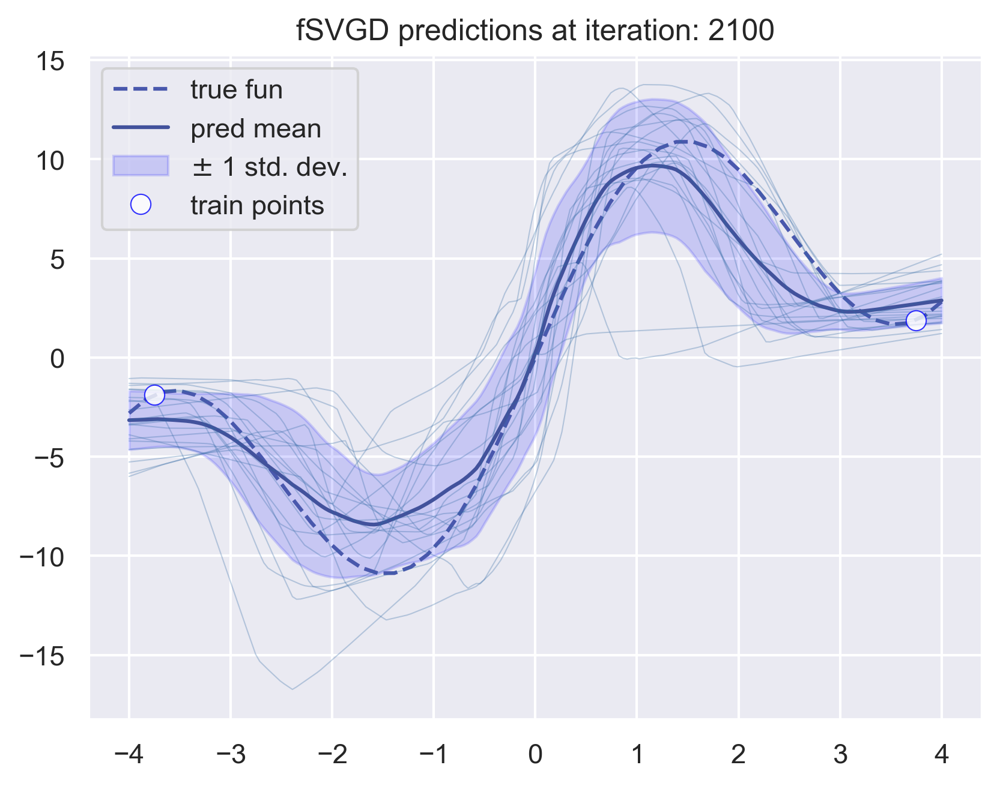

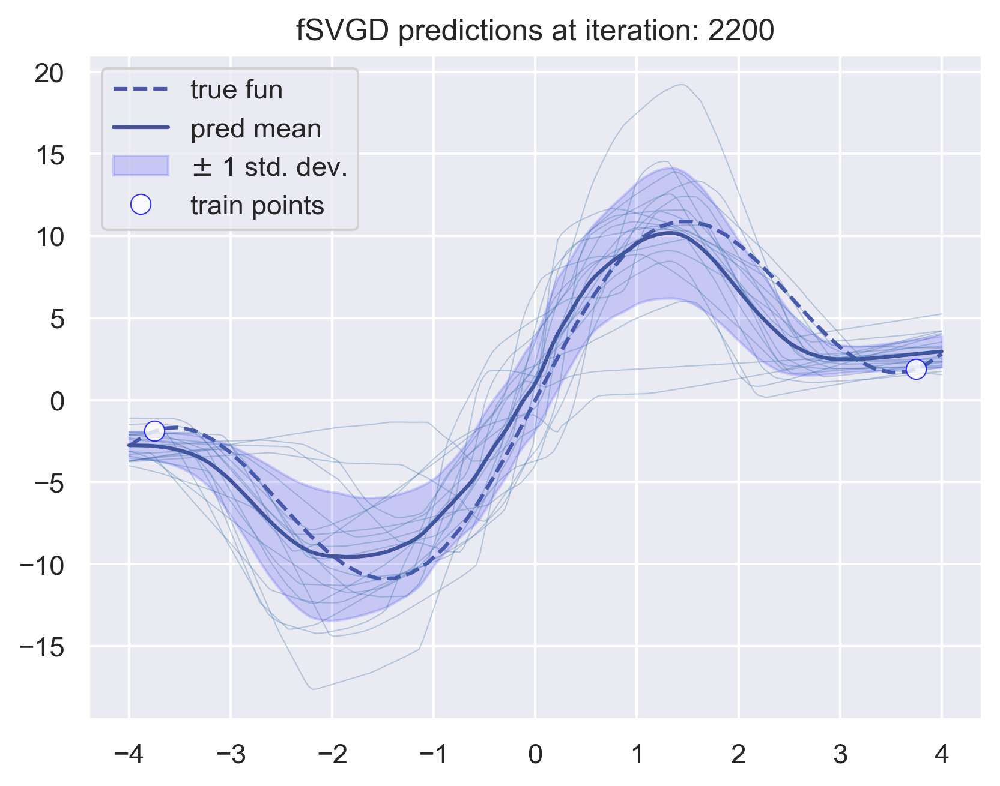

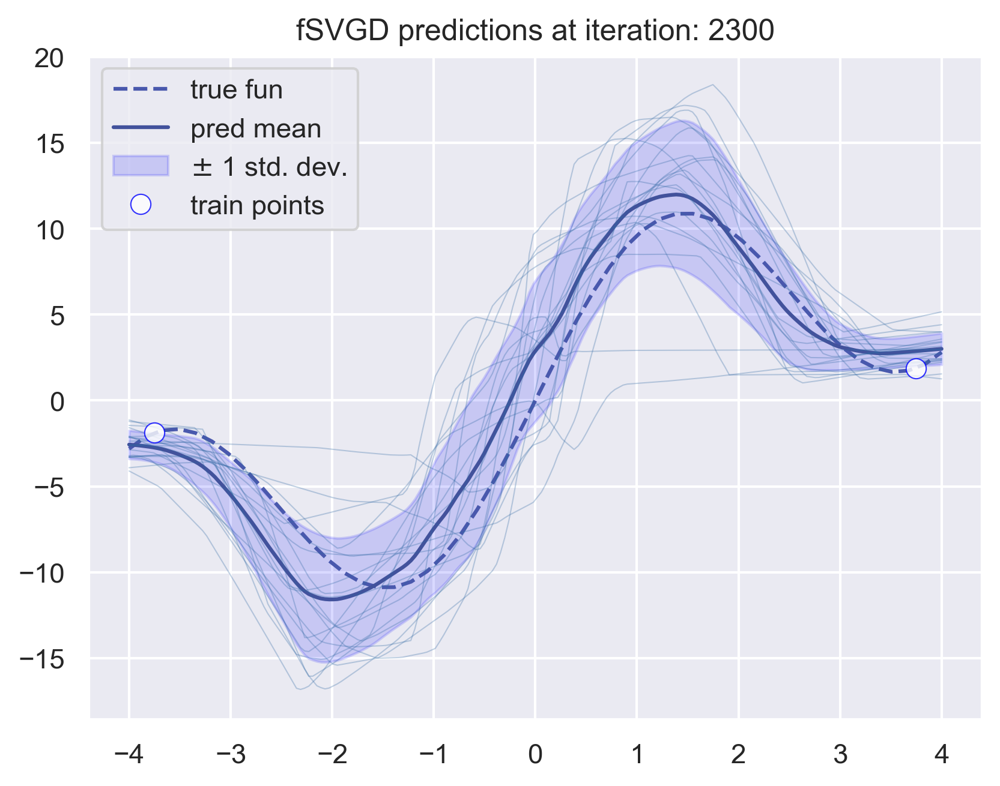

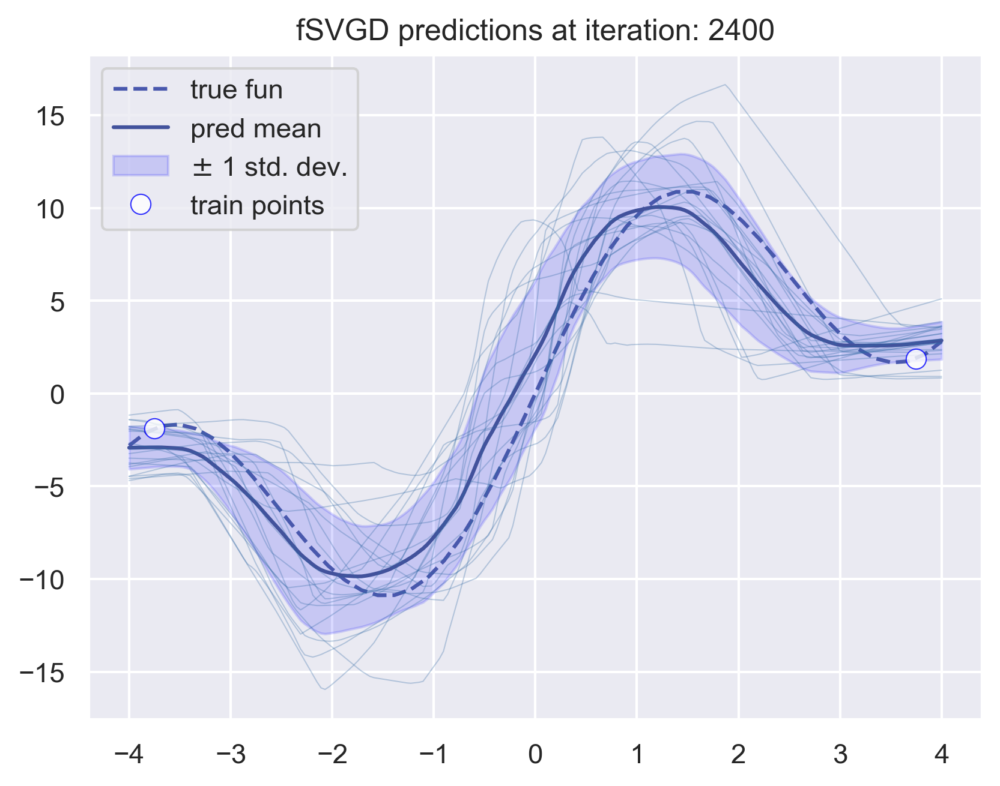

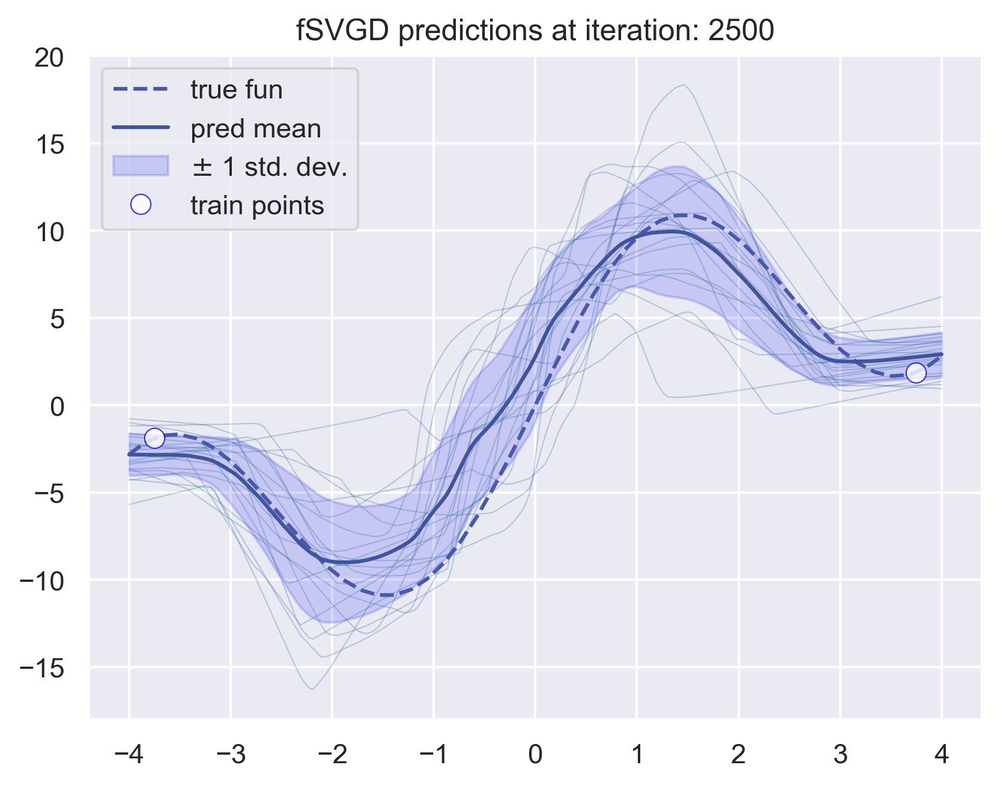

In [20]:
from MARS.models.bnn_fsvgd_score_nn import BNN_fSVGD_MARS

# initialize fSVGD
bnn = BNN_fSVGD_MARS(score_network=score_net,
                     rng_key=next(hk_key),
                     lr=0.0075,
                     num_train_steps=20000,
                     likelihood_std=1.25,
                     bandwidth_svgd=0.125)

# train fSVGD
for i in tqdm(range(25)):
    eval_stats = bnn.fit(x_train, y_train, x_eval=x_test, y_eval=y_test, num_steps=100)
    bnn.plot_1d(x_train, y_train, domain_l=jnp.array([-4]), domain_u=jnp.array([4]),
                title='fSVGD predictions at iteration: ' + str((i+1) * 100),
                plot_data=(jnp.linspace(-4, 4, 50), sim.dataset.mean_fn(jnp.linspace(-4, 4, 50))))


From the output above, we can see that the Score Estimator network has successfully picked up periodical, sinusoidal-type of behaviour. Furthermore, it has successfully guided the fSVGD BNN towards the correct mean function.